# Gravity
**Description:**  Gridded gravity anomaly data from various sources.

**Datasets:** 

ANTGG (2016) accessed from https://doi.pangaea.de/10.1594/PANGAEA.848168

ANTGG-update accessed from https://ftp.space.dtu.dk/pub/RF/4D-ANTARCTICA/

ANTGG-2021 accessed from https://doi.pangaea.de/10.1594/PANGAEA.971238?format=html#download

Uieda, Leonardo. “Fatiando a Terra Data: Earth - Gravity Grid at 10 Arc-Minute Resolution.” Zenodo, January 20, 2022. https://doi.org/10.5281/zenodo.5882207.

Förste, Christoph, Sean.L. Bruinsma, Oleg Abrikosov, Jean-Michel Lemoine, Jean Charles Marty, Frank Flechtner, G. Balmino, F. Barthelmes, and R. Biancale. “EIGEN-6C4 The Latest Combined Global Gravity Field Model Including GOCE Data up to Degree and Order 2190 of GFZ Potsdam and GRGS Toulouse.” Application/octet-stream,application/octet-stream,application/zip. GFZ Data Services, 2014. https://doi.org/10.5880/ICGEM.2015.1.

**Associated papers:** 

Scheinert, M., F. Ferraccioli, J. Schwabe, R. Bell, M. Studinger, D. Damaske, W. Jokat, et al. “New Antarctic Gravity Anomaly Grid for Enhanced Geodetic and Geophysical Studies in Antarctica.” Geophysical Research Letters 43, no. 2 (2016): 600–610. https://doi.org/10.1002/2015GL067439.


In [1]:
%%capture
%load_ext autoreload
%autoreload 2

from polartoolkit import fetch, maps, regions, utils

In [2]:
# get min/max for each anomaly type
version_names = [
    "antgg",
    "antgg-update",
    "antgg-2021",
    "eigen",
]
FA_grids = []
BA_grids = []
Err_grids = []

for name in version_names:
    if name == "antgg":
        anomaly_types = ["FA", "BA"]
    elif name == "antgg-update" or name == "antgg-2021":
        anomaly_types = ["FA", "DG", "BA", "Err"]
    elif name == "eigen":
        anomaly_types = [None]
    for a in anomaly_types:
        data = fetch.gravity(
            version=name,
            anomaly_type=a,
        )
        if (a == "FA") or (a == "DG"):
            FA_grids.append(data)
        if a == "BA":
            BA_grids.append(data)
        if a == "Err":
            Err_grids.append(data)
FA_lims = utils.get_combined_min_max(FA_grids, robust=True)
BA_lims = utils.get_combined_min_max(BA_grids, robust=True)
Err_lims = utils.get_combined_min_max(Err_grids, robust=True)

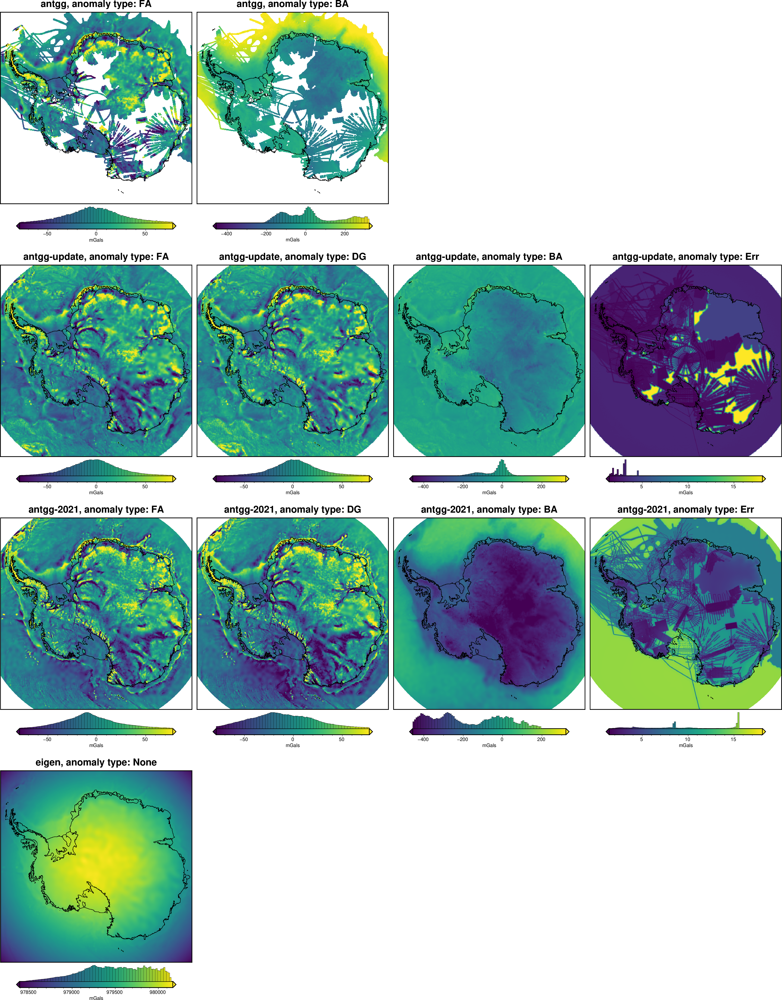

In [3]:
version_names = [
    "antgg",
    "antgg-update",
    "antgg-2021",
    "eigen",
]
for i, name in enumerate(version_names):
    if name == "antgg":
        anomaly_types = ["FA", "BA"]
    elif name == "antgg-update" or name == "antgg-2021":
        anomaly_types = ["FA", "DG", "BA", "Err"]
    elif name == "eigen":
        anomaly_types = [None]

    for j, a in enumerate(anomaly_types):
        title = f"{name}, anomaly type: {a}"
        data = fetch.gravity(
            version=name,
            anomaly_type=a,
            # available options
            # region,
            # spacing,
            # registration ("g" for gridline or "p" for pixel),
        )
        if (i == 0) and (j == 0):
            fig = None
            origin_shift = "initialize"
            xshift_amount = None
        elif j == 0:
            origin_shift = "both_shift"
            xshift_amount = -previous_j
        else:
            origin_shift = "xshift"
            xshift_amount = 1

        # use same colorscales for the same anomaly types
        cpt_lims = None
        if (a == "FA") or (a == "DG"):
            cpt_lims = FA_lims
        if a == "BA":
            cpt_lims = BA_lims
        if a == "Err":
            cpt_lims = Err_lims

        previous_j = j
        fig = maps.plot_grd(
            data,
            fig=fig,
            origin_shift=origin_shift,
            xshift_amount=xshift_amount,
            yshift_amount=-1.1,
            region=regions.antarctica,
            title=title,
            cbar_label="mGals",
            coast=True,
            cmap="viridis",
            cpt_lims=cpt_lims,
            hist=True,
            cbar_yoffset=1.5,
            hemisphere="south",
        )
fig.show(dpi=200)